https://archive.ics.uci.edu/ml/datasets/Appliances+energy+prediction

In [134]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))


# Import Required Pkgs

In [135]:
from pathlib import Path

import numpy as np
import pandas as pd
import pandas_profiling

import matplotlib.pyplot as plt
import cufflinks as cf
import plotly.offline
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

from sklearn.svm import SVC
from sklearn.model_selection import learning_curve
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
import graphviz 
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import cross_val_score

import pylab
from scipy import stats
import random

In [136]:
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 50000)

# Import Data

In [137]:
data_dir = Path('../../data')
data_input = data_dir / 'energydata_complete.csv'
data_output = Path('/')

In [138]:
df = pd.read_csv(data_input,parse_dates = True,infer_datetime_format = True)

In [139]:
df.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,17.166667,55.20,7.026667,84.256667,17.200000,41.626667,18.2,48.900000,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,17.166667,55.20,6.833333,84.063333,17.200000,41.560000,18.2,48.863333,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,17.166667,55.09,6.560000,83.156667,17.200000,41.433333,18.2,48.730000,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,17.166667,55.09,6.433333,83.423333,17.133333,41.290000,18.1,48.590000,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,17.200000,55.09,6.366667,84.893333,17.200000,41.230000,18.1,48.590000,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [140]:
df.drop(['lights','rv1','rv2'],inplace=True,axis = 1)

In [141]:
df_columns = df.columns
numericCols = df._get_numeric_data().columns

categoricalCols = list(set(df_columns) - set(numericCols))
print('The categorical columns in transaction data are: ',categoricalCols)

The categorical columns in transaction data are:  ['date']


# EDA

In [142]:
pandas_profiling.ProfileReport(df)

# Feature engineering and Selection

In [143]:
df['date'] = pd.to_datetime(df['date'])
df['year'] = df['date'].dt.year
df['month']= df['date'].dt.month
df['hour'] = df['date'].dt.hour
df['weekday'] = df['date'].dt.dayofweek

In [144]:
for col in ['year','month','weekday','hour']:
    print(df[col].unique())

[2016]
[1 2 3 4 5]
[0 1 2 3 4 5 6]
[17 18 19 20 21 22 23  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16]


In [145]:
for col in ['month','weekday','hour']:
     df[col] = df[col].astype('category')

In [146]:
#drop highly correlated vars
df.drop(['date','year','T9','T_out'],axis = 1,inplace = True)

In [147]:
pandas_profiling.ProfileReport(df[['Appliances','month','weekday','hour']])

In [148]:
#convert categories to dummy variables
df.groupby('month').sum().Appliances

month
1    283510
2    421550
3    432800
4    427200
5    362950
Name: Appliances, dtype: int64

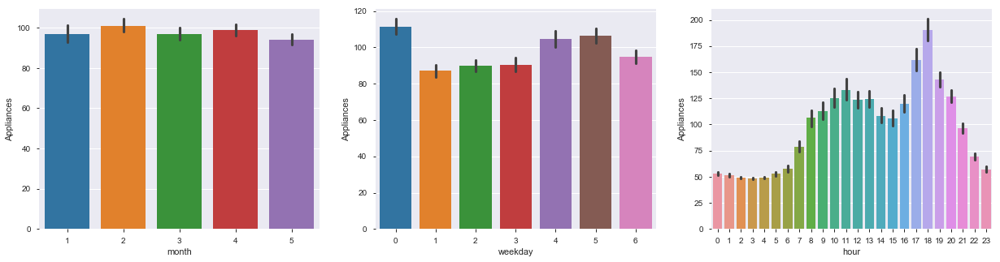

In [149]:
plt.figure(figsize = (21,5))
plt.subplot(1,3,1)
sns.barplot(x = df.month,y = df.Appliances)
plt.subplot(1,3,2)
sns.barplot(x = df.weekday,y = df.Appliances)
plt.subplot(1,3,3)
sns.barplot(x = df.hour,y = df.Appliances)
plt.show()

In [150]:
#convert categorical variables to dummy binary vars
month_dummy = pd.get_dummies(df.month, drop_first=True)
hour_dummy = pd.get_dummies(df.hour, drop_first=True)
weekday_dummy = pd.get_dummies(df.weekday, drop_first=True)

In [151]:
df = pd.concat([df , month_dummy,hour_dummy,weekday_dummy],axis = 1)

In [152]:
df.drop(['month','hour','weekday'],axis  = 1,inplace = True)
df.head()

,Appliances,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,RH_9,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,2,3,4,5,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,1,2,3,4,5,6
0,60,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,17.166667,55.20,7.026667,84.256667,17.200000,41.626667,18.2,48.900000,45.53,733.5,92.0,7.000000,63.000000,5.3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
1,60,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,17.166667,55.20,6.833333,84.063333,17.200000,41.560000,18.2,48.863333,45.56,733.6,92.0,6.666667,59.166667,5.2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
2,50,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,17.166667,55.09,6.560000,83.156667,17.200000,41.433333,18.2,48.730000,45.50,733.7,92.0,6.333333,55.333333,5.1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,50,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,17.166667,55.09,6.433333,83.423333,17.133333,41.290000,18.1,48.590000,45.40,733.8,92.0,6.000000,51.500000,5.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
4,60,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,17.200000,55.09,6.366667,84.893333,17.200000,41.230000,18.1,48.590000,45.40,733.9,92.0,5.666667,47.666667,4.9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0


# Model - Data Prepration

In [153]:
df['Target'] = df.Appliances>=100
df['Target'] = df.Target.map({True:1,False:0})
df.Target.value_counts()

0    14524
1     5211
Name: Target, dtype: int64

In [154]:
#Splitting the data
Y = df.Target
X = df.drop(['Appliances','Target'],axis = 1)

In [155]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, random_state = 0, test_size = 0.3)

#Scaling data from 0 to 1
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# SVM

In [156]:
def plot_learning_curve(model,title,train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure(figsize = (20,5))
    plt.title(title)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(model,X_train, Y_train,train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt


def svm_model(kernel='linear'):
    model =SVC(kernel = kernel)
    model.fit(X_train,Y_train)
    print("Training Accracy ",round(model.score(X_train,Y_train)*100,2),"%")
    print("Testing Accracy ",round(model.score(X_test,Y_test)*100,2),"%\n")
    p = model.predict(X_test)
    predictions = np.where(p>=0.5,1,0)
    print("Confusion Matrix: -- ")
    print(confusion_matrix(Y_test,predictions))
    plot_learning_curve(model = model,title = kernel,train_sizes=np.linspace(.1, 1.0, 5))
    plt.show()


### Linear kernel

Training Accracy  82.64 %
Testing Accracy  81.41 %

Confusion Matrix: -- 
[[4065  288]
 [ 813  755]]


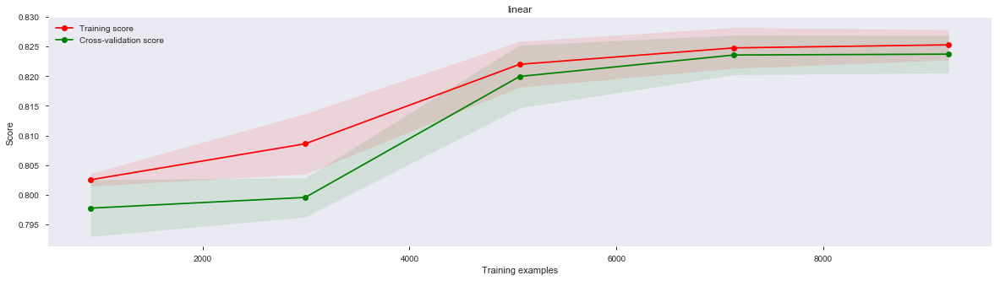

In [157]:
svm_model('linear')

### rbf kernel

Training Accracy  79.97 %
Testing Accracy  78.8 %

Confusion Matrix: -- 
[[4124  229]
 [1026  542]]


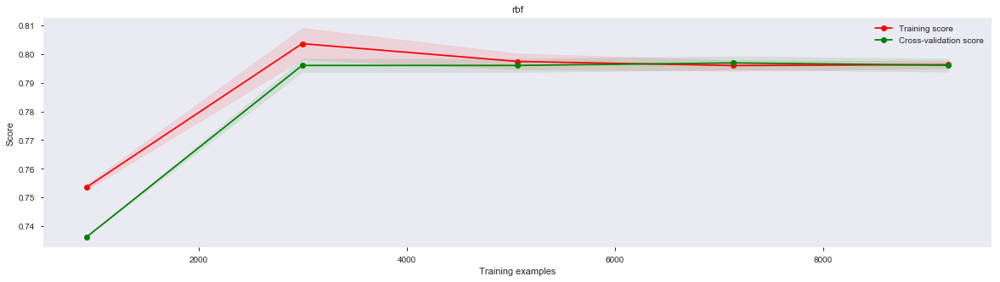

In [158]:
svm_model('rbf')

### poly kernel

Training Accracy  73.63 %
Testing Accracy  73.52 %

Confusion Matrix: -- 
[[4353    0]
 [1568    0]]


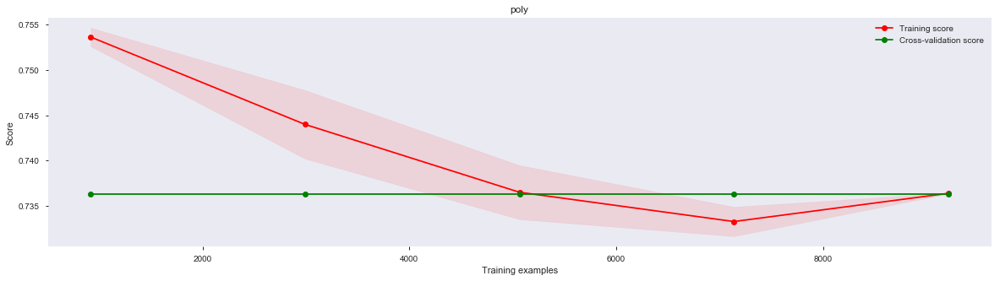

In [159]:
svm_model('poly')

# Decision Tree

In [160]:
def decision_tree(criterion,depth):
    clf = DecisionTreeClassifier(criterion=criterion,max_depth = depth)
    clf = clf.fit(X_train, Y_train)
    dot_data = tree.export_graphviz(clf, out_file=None) 
    graph = graphviz.Source(dot_data) 
     
    print("Training Accracy ",round(clf.score(X_train,Y_train)*100,2),"%")
    print("Testing Accracy ",round(clf.score(X_test,Y_test)*100,2),"%\n")
    p = clf.predict(X_test)
    predictions = np.where(p>=0.5,1,0)
    print("Confusion Matrix: -- ")
    print(confusion_matrix(Y_test,predictions))
    plot_learning_curve(model = clf,title = "Decision Tree",train_sizes=np.linspace(.1, 1.0, 5))
    plt.show()
    return(graph)

Training Accracy  100.0 %
Testing Accracy  87.67 %

Confusion Matrix: -- 
[[4002  351]
 [ 379 1189]]


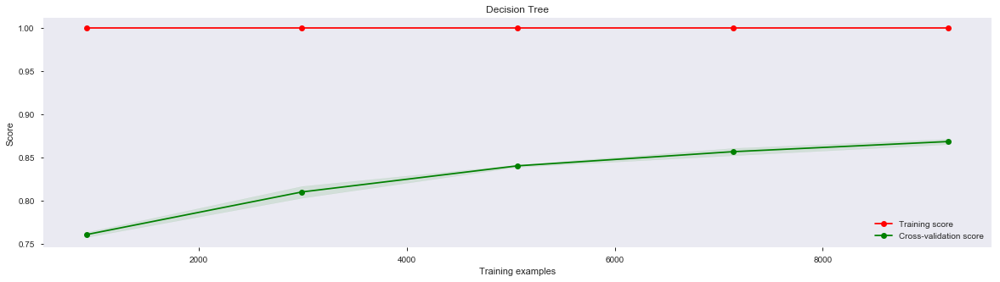

In [161]:
decision_tree(criterion = 'gini',depth = 40)

Training Accracy  99.49 %
Testing Accracy  87.57 %

Confusion Matrix: -- 
[[4004  349]
 [ 387 1181]]


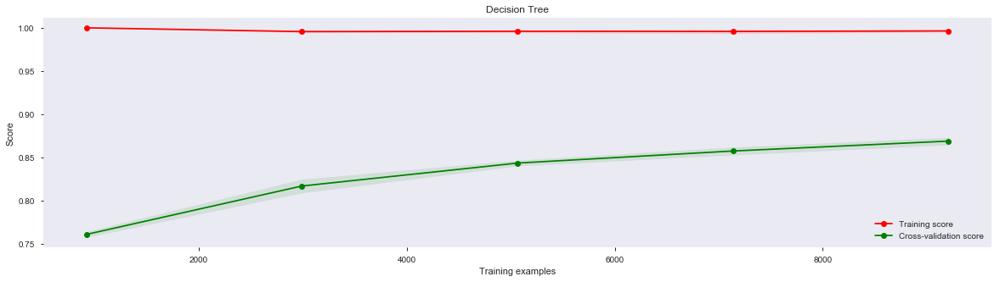

In [162]:
decision_tree(criterion = 'gini',depth = 25)

Training Accracy  87.61 %
Testing Accracy  83.79 %

Confusion Matrix: -- 
[[4071  282]
 [ 678  890]]


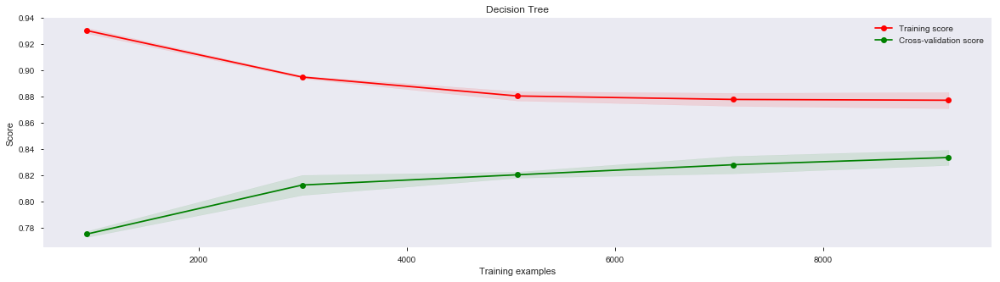

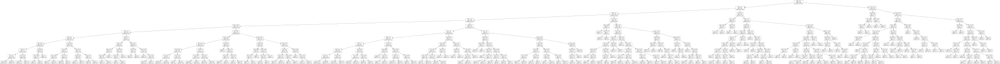

In [163]:
decision_tree(criterion = 'gini',depth = 10)

Training Accracy  78.2 %
Testing Accracy  77.13 %

Confusion Matrix: -- 
[[4224  129]
 [1225  343]]


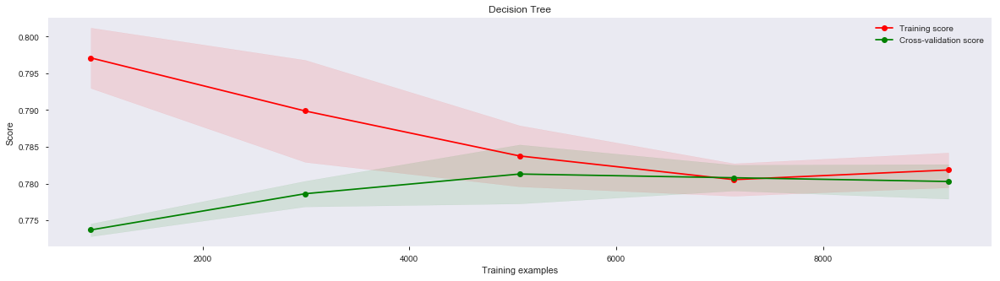

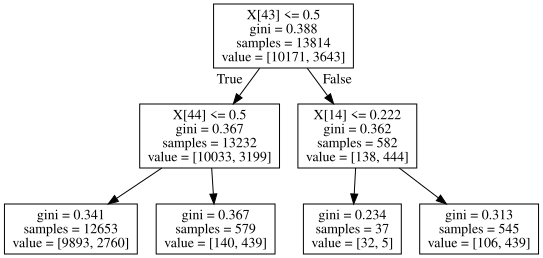

In [164]:
decision_tree(criterion = 'gini',depth = 2)

# Gradient Boosting

In [165]:
def Gradient_Boosting(n_estimators,depth):
    clf = GradientBoostingClassifier(learning_rate=0.1, n_estimators=n_estimators, max_depth=depth)
    clf = clf.fit(X_train, Y_train)     
    print("Training Accracy ",round(clf.score(X_train,Y_train)*100,2),"%")
    print("Testing Accracy ",round(clf.score(X_test,Y_test)*100,2),"%\n")
    p = clf.predict(X_test)
    predictions = np.where(p>=0.5,1,0)
    print("Confusion Matrix: -- ")
    print(confusion_matrix(Y_test,predictions))
    plot_learning_curve(model = clf,title = "Gradient Boosting Tree",train_sizes=np.linspace(.1, 1.0, 5))
    plt.show()

Training Accracy  100.0 %
Testing Accracy  88.19 %

Confusion Matrix: -- 
[[4020  333]
 [ 366 1202]]


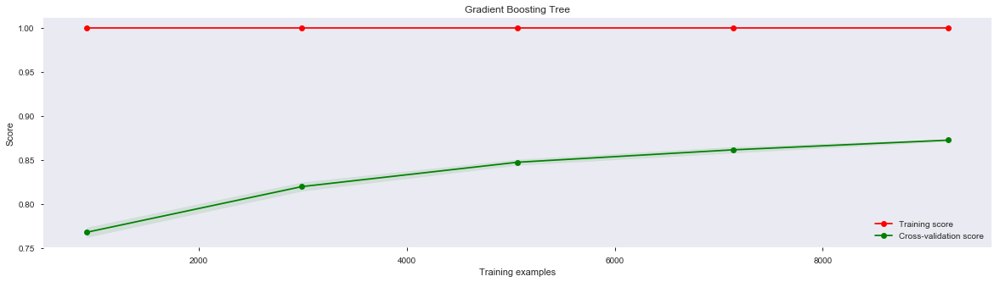

In [166]:
Gradient_Boosting(100,30)

Training Accracy  99.41 %
Testing Accracy  89.41 %

Confusion Matrix: -- 
[[4117  236]
 [ 391 1177]]


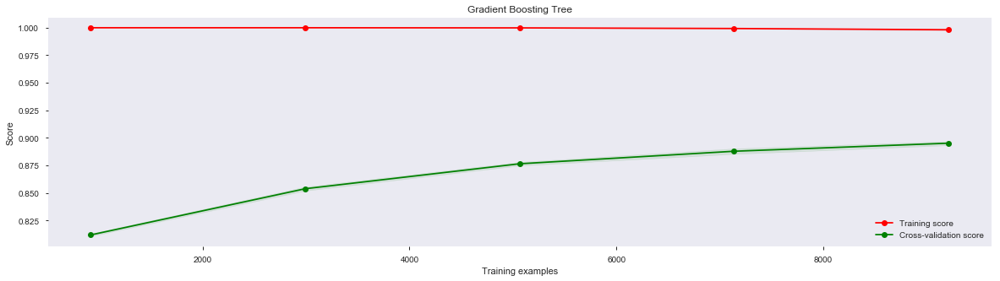

In [167]:
Gradient_Boosting(100,10)

# CrossValidation

In [168]:
svm = SVC()
dtree = DecisionTreeClassifier(criterion = 'gini',max_depth = 10)
boosting = GradientBoostingClassifier(learning_rate=0.1, n_estimators=100, max_depth=10)

In [169]:
scores = cross_val_score(svm,X,Y,cv = 5)
print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

Accuracy: 0.72 (+/- 0.02)


In [170]:
scores = cross_val_score(dtree,X,Y,cv = 5)
print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

Accuracy: 0.70 (+/- 0.22)


In [171]:
scores = cross_val_score(boosting,X,Y,cv = 5)
print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

Accuracy: 0.71 (+/- 0.16)
